In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# !cp -r ../input/"drive2004" ../working/


In [2]:
# import shutil
# shutil.copytree('/kaggle/input/drive2004/DRIVE/test', '/kaggle/working/test')
# shutil.copytree('/kaggle/input/drive2004/DRIVE/training/1st_manual', '/kaggle/working/1st_manual')
# shutil.copytree('/kaggle/input/drive2004/DRIVE/training/images', '/kaggle/working/images')


In [3]:
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from PIL import Image
import torchvision

In [4]:
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from PIL import Image
import torchvision

In [5]:
class CustomDataset(Dataset):
    def __init__(self, image_folder, mask_folder, transform=None,target_size=(512, 512)):
        self.image_folder = image_folder
        self.mask_folder = mask_folder
        self.target_size = target_size
        self.transform = transform
        self.transform_M = transforms.Compose([
            transforms.ToTensor(),
            #transforms.Normalize(mean=[0.0], std=[1/255.0])
        ])
        
        self.image_filenames = os.listdir(image_folder)
        self.mask_filenames = os.listdir(mask_folder)
        
    def __len__(self):
        return len(self.image_filenames)
    
    def __getitem__(self, idx):
        image_path = os.path.join(self.image_folder, self.image_filenames[idx])
        mask_path = os.path.join(self.mask_folder, self.mask_filenames[idx])
        
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        
        if self.target_size:
            image = image.resize(self.target_size)
            mask = mask.resize(self.target_size)
        if self.transform:
            image = self.transform(image)
        image = transforms.ToTensor()(image)
        #image = transforms.Normalize(mean=[0.0, 0.0, 0.0], std=[1/255.0, 1/255.0, 1/255.0])(image)
        
        mask = self.transform_M(mask)
        
        
        return {"image": image, "mask": mask}


In [6]:
# Example usage:
dataset = CustomDataset("/kaggle/input/augmented-drive/new_data/train/image", "/kaggle/input/augmented-drive/new_data/train/mask")
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

for batch in dataloader:
    images = batch["image"]
    masks = batch["mask"]
    print("Image shape:", images.shape)
    print("Mask shape:", masks.shape)

Image shape: torch.Size([32, 3, 512, 512])
Mask shape: torch.Size([32, 1, 512, 512])
Image shape: torch.Size([32, 3, 512, 512])
Mask shape: torch.Size([32, 1, 512, 512])
Image shape: torch.Size([16, 3, 512, 512])
Mask shape: torch.Size([16, 1, 512, 512])


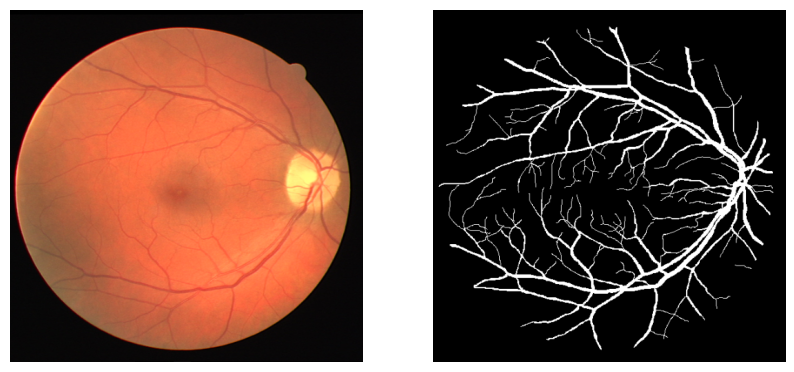

In [7]:
import matplotlib.pyplot as plt

# assuming you have only one image and mask in the batch
img = images[0].permute(1, 2, 0)
mask = masks[0].squeeze(0)


# plot the image and mask
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img)
ax[0].axis('off')
ax[1].imshow(mask, cmap='gray')
ax[1].axis('off')
plt.show()

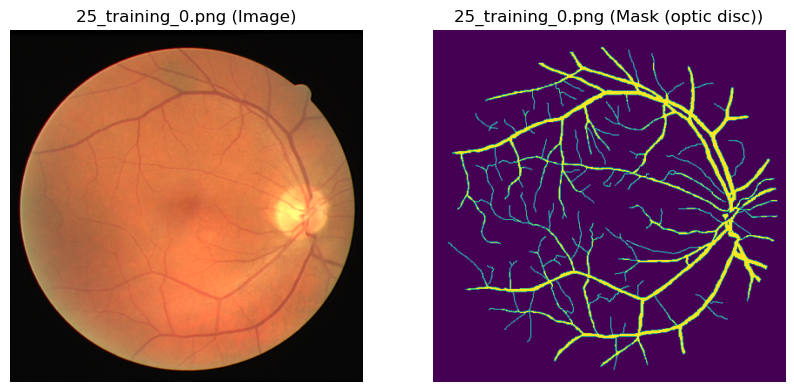

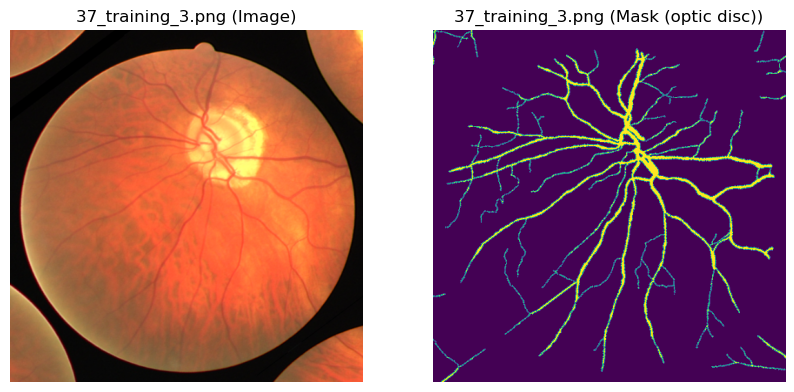

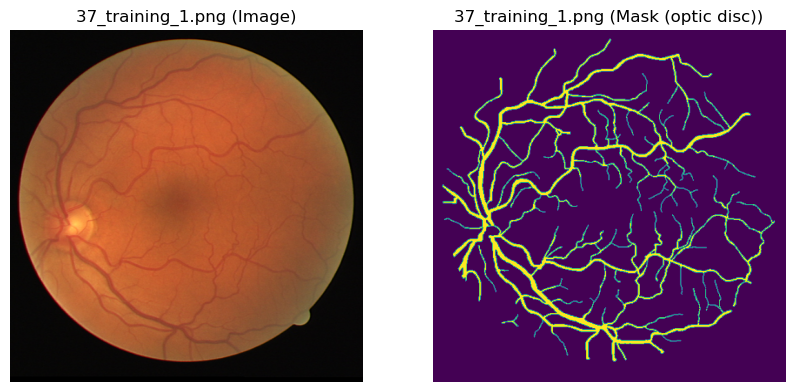

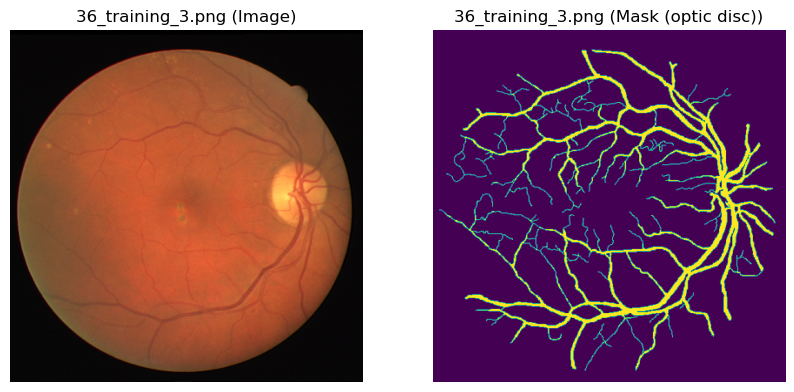

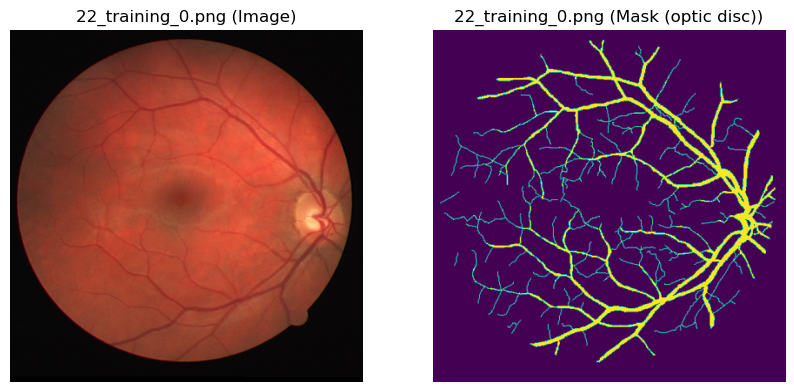

...

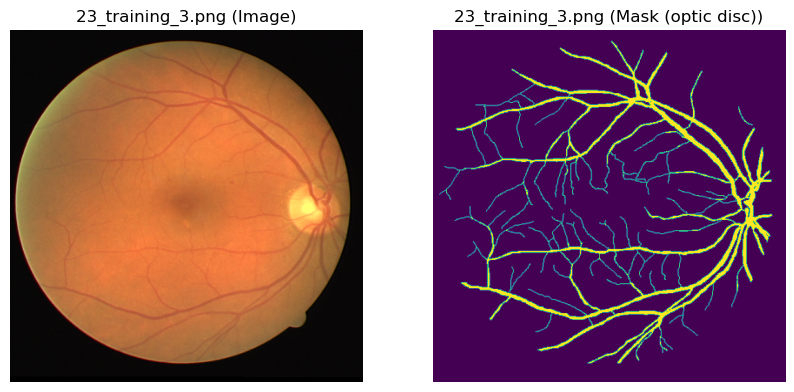

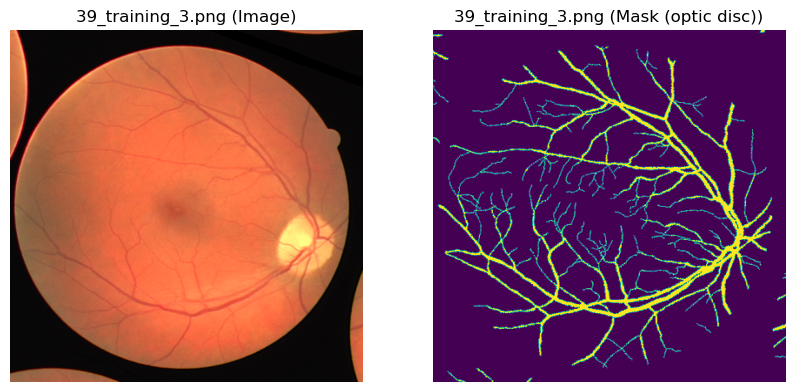

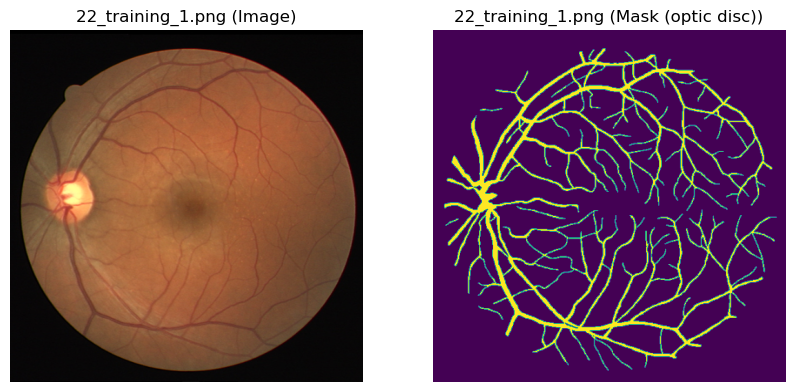

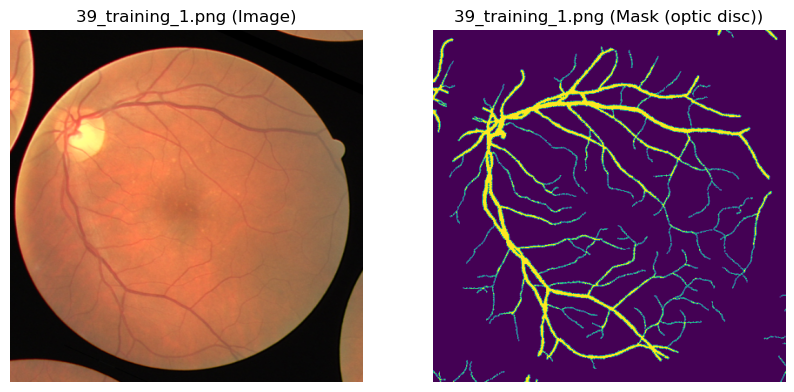

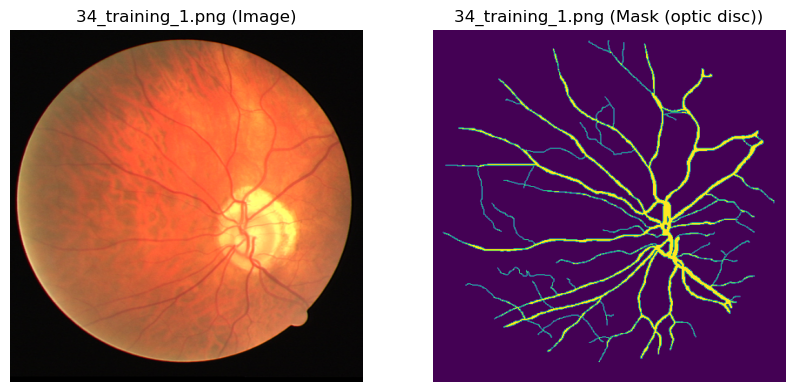

In [ ]:
import matplotlib.pyplot as plt

label_dict = {0: "background", 1: "optic disc"}

for batch_idx, batch_sample in enumerate(dataloader):
    images = batch_sample['image']
    masks = batch_sample['mask']
    image_filenames = dataset.image_filenames[batch_idx * dataloader.batch_size : (batch_idx + 1) * dataloader.batch_size]
    mask_filenames = dataset.mask_filenames[batch_idx * dataloader.batch_size : (batch_idx + 1) * dataloader.batch_size]
    
    for i in range(len(images)):
        image = images[i]
        mask = masks[i]
        image_filename = image_filenames[i]
        mask_filename = mask_filenames[i]
        
        # Convert mask back to PIL Image for visualization
        mask = transforms.ToPILImage()(mask)
        
        # Display image and mask with labels and file names
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(transforms.ToPILImage()(image))
        ax1.set_title(f'{image_filename} (Image)')
        ax1.axis('off')
        ax2.imshow(mask)
        ax2.set_title(f'{mask_filename} (Mask ({label_dict[1]}))')
        ax2.axis('off')
        plt.show()



In [67]:
import os
import time
import random
import numpy as np
import cv2
import torch

""" Seeding the randomness. """
def seeding(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

""" Create a directory. """
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

""" Calculate the time taken """
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

In [68]:
import torch
import torch.nn as nn

class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x

class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        outputs = self.outputs(d4)

        return outputs

# if __name__ == "__main__":
#     x = torch.randn((2, 3, 512, 512))
#     f = build_unet()
#     y = f(x)
#     print(y.shape)

In [69]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F

# class DiceLoss(nn.Module):
#     def __init__(self, weight=None, size_average=True):
#         super(DiceLoss, self).__init__()

#     def forward(self, inputs, targets, smooth=1):

#         #comment out if your model contains a sigmoid or equivalent activation layer
#         inputs = torch.sigmoid(inputs)

#         #flatten label and prediction tensors
#         inputs = inputs.view(-1)
        
#         targets = targets.view(2, 512*512)  # Reshape the target tensor to (2, 262144)
#         targets = targets.unsqueeze(1)      # Add a new dimension of size 1 to the target tensor to make it (2, 1, 262144)
#         targets = targets.repeat(1, 3, 1)   # Repeat the target tensor along the second dimension to make it (2, 3, 262144)
#         targets = targets.view(2, 3, 512, 512)  # Reshape the target tensor to match the shape of the input tensor
#         targets = targets.view(-1)

#         intersection = (inputs * targets).sum()
#         dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

#         return 1 - dice

# class DiceBCELoss(nn.Module):
#     def __init__(self, weight=None, size_average=True):
#         super(DiceBCELoss, self).__init__()

#     def forward(self, inputs, targets, smooth=1):

#         #comment out if your model contains a sigmoid or equivalent activation layer
#         inputs = torch.sigmoid(inputs)

#         #flatten label and prediction tensors
#         # inputs = inputs.view(-1)
#         inputs = inputs.view(2, 512*512)  # Reshape the target tensor to (2, 262144)
#         inputs = inputs.unsqueeze(1)      # Add a new dimension of size 1 to the target tensor to make it (2, 1, 262144)
#         inputs = inputs.repeat(1, 3, 1)   # Repeat the target tensor along the second dimension to make it (2, 3, 262144)
#         inputs = inputs.view(2, 3, 512, 512)  # Reshape the target tensor to match the shape of the input tensor
#         inputs = inputs.view(-1)
#         targets = targets.view(-1)

#         intersection = (inputs * targets).sum()
#         dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)
#         BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
#         Dice_BCE = BCE + dice_loss

#         return Dice_BCE

In [70]:

import torch
import torch.nn as nn
import torch.nn.functional as F

class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss

        return Dice_BCE

In [71]:
import os
import time
from glob import glob

import torch
from torch.utils.data import DataLoader
import torch.nn as nn

def train(model, loader, optimizer, loss_fn, device):
    epoch_loss = 0.0

    model.train()
    for batch in loader:
        x = batch["image"].to(device, dtype=torch.float32)
        y = batch["mask"].to(device, dtype=torch.float32)

        optimizer.zero_grad()
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        
        

    epoch_loss = epoch_loss/len(loader)
    return epoch_loss

def evaluate(model, loader, loss_fn, device):
    epoch_loss = 0.0

    model.eval()
    with torch.no_grad():
        for batch in loader:
            x = batch["image"].to(device, dtype=torch.float32)
            y = batch["mask"].to(device, dtype=torch.float32)

            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            epoch_loss += loss.item()

        epoch_loss = epoch_loss/len(loader)
    return epoch_loss

In [72]:
""" Seeding """
seeding(42)
""" Directories """
create_dir("/content/drive/MyDrive/DRIVE")


""" Hyperparameters """
H = 512
W = 512
size = (H, W)
batch_size = 2
num_epochs = 50
lr = 1e-4
checkpoint_path = "/kaggle/working/checkpoint.pth"

# Train:
dataset_train = CustomDataset("/kaggle/input/augmented-drive/new_data/train/image", "/kaggle/input/augmented-drive/new_data/train/mask")
dataloader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True,num_workers=1,timeout=120)
# Val:
dataset_val= CustomDataset("/kaggle/input/chase-db1/Images", "/kaggle/input/chase-db1/Masks")
dataloader_val = DataLoader(dataset_val, batch_size=batch_size, shuffle=True,num_workers=1,timeout=120)


In [73]:
for batch in dataloader_train:
    train_x = batch["image"]
    train_y = batch["mask"]
    print("Image shape:", train_x.shape)
    print("Mask shape:", train_y.shape)

Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Image shape: torch.Size([2, 3, 512, 512])
Mask shape: torch.Size([2, 1, 512, 512])
Imag

In [74]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')   ## GTX 1060 6GB
model = build_unet()
model = model.to(device)

In [75]:
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, verbose=True)
loss_fn = DiceBCELoss()

In [76]:
""" Training the model """
best_valid_loss = float("inf")

In [77]:

for epoch in range(num_epochs):
    start_time = time.time()
    
    train_loss = train(model, dataloader_train, optimizer, loss_fn, device)
    valid_loss = evaluate(model, dataloader_val, loss_fn, device)

    """ Saving the model """
    if valid_loss < best_valid_loss:
        data_str = f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving checkpoint: {checkpoint_path}"
        print(data_str)

        best_valid_loss = valid_loss
        torch.save(model.state_dict(), checkpoint_path)

    end_time = time.time()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    data_str = f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s\n'
    data_str += f'\tTrain Loss: {train_loss:.3f}\n'
    data_str += f'\t Val. Loss: {valid_loss:.3f}\n'
    print(data_str)


Valid loss improved from inf to 1.3245. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 01 | Epoch Time: 0m 21s
	Train Loss: 1.210
	 Val. Loss: 1.325

Valid loss improved from 1.3245 to 1.3011. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 02 | Epoch Time: 0m 21s
	Train Loss: 1.032
	 Val. Loss: 1.301

Valid loss improved from 1.3011 to 1.2787. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 03 | Epoch Time: 0m 21s
	Train Loss: 0.973
	 Val. Loss: 1.279

Valid loss improved from 1.2787 to 1.2464. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 04 | Epoch Time: 0m 21s
	Train Loss: 0.920
	 Val. Loss: 1.246

Valid loss improved from 1.2464 to 1.2252. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 05 | Epoch Time: 0m 21s
	Train Loss: 0.879
	 Val. Loss: 1.225

Valid loss improved from 1.2252 to 1.2106. Saving checkpoint: /kaggle/working/checkpoint.pth
Epoch: 06 | Epoch Time: 0m 21s
	Train Loss: 0.841
	 Val. Loss: 1.211

Valid loss improved from 

# **Test**

  0%|          | 0/28 [00:00<?, ?it/s]

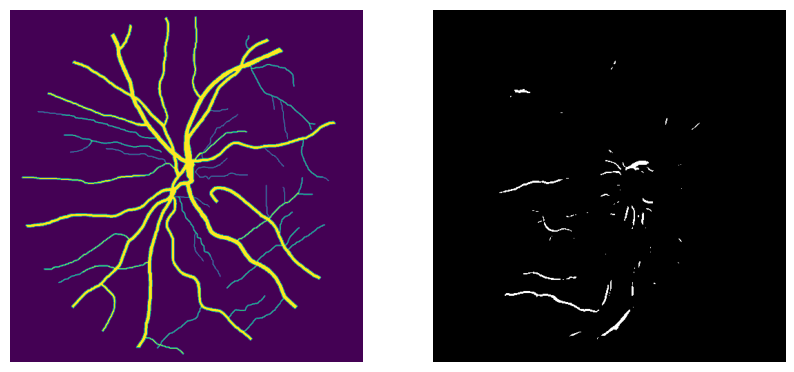

  4%|▎         | 1/28 [00:00<00:24,  1.10it/s]

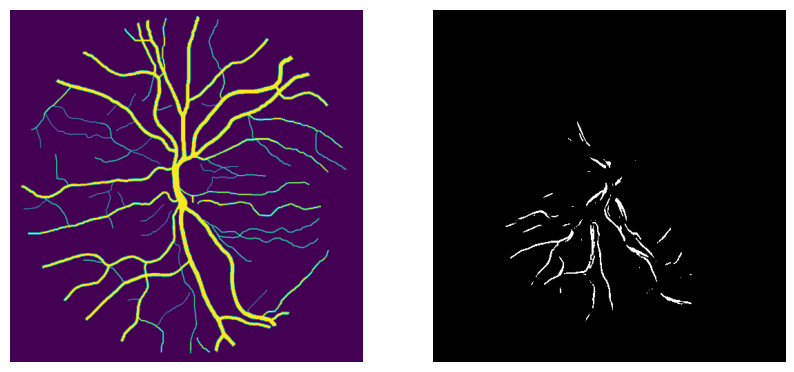

  7%|▋         | 2/28 [00:01<00:17,  1.47it/s]

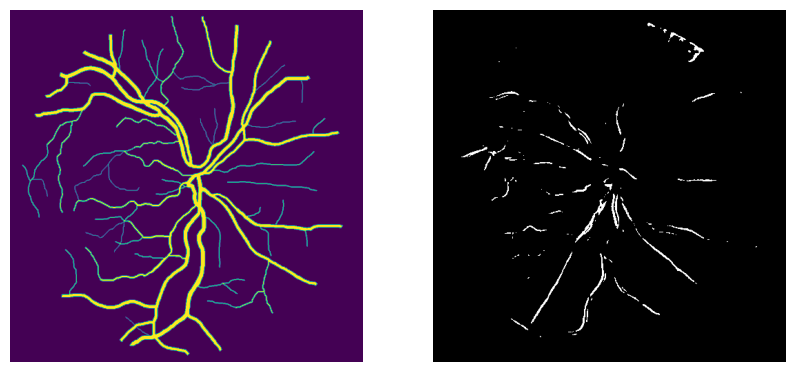

 11%|█         | 3/28 [00:01<00:15,  1.66it/s]

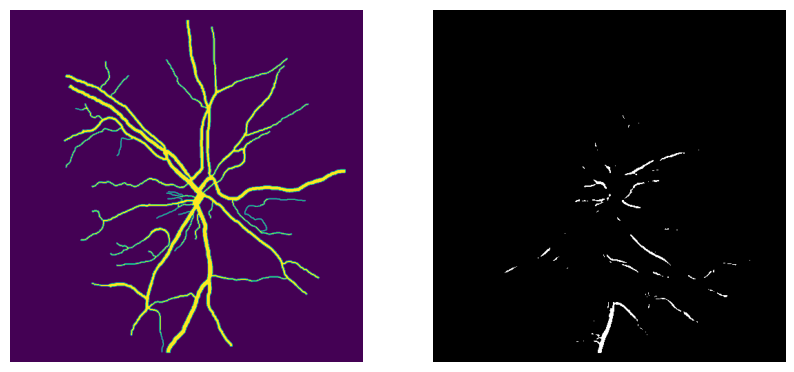

 14%|█▍        | 4/28 [00:02<00:13,  1.78it/s]

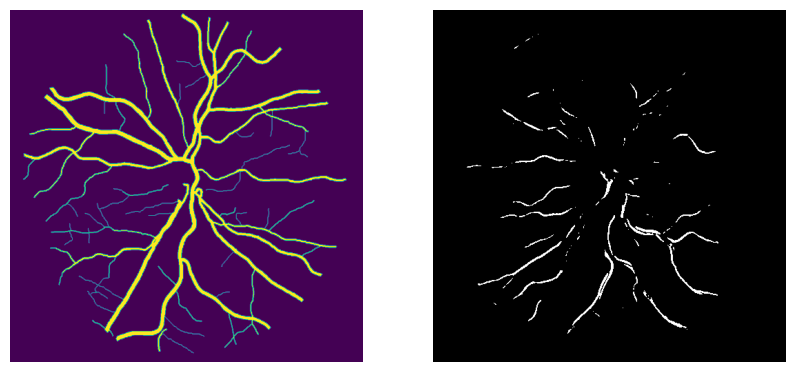

 18%|█▊        | 5/28 [00:02<00:12,  1.84it/s]

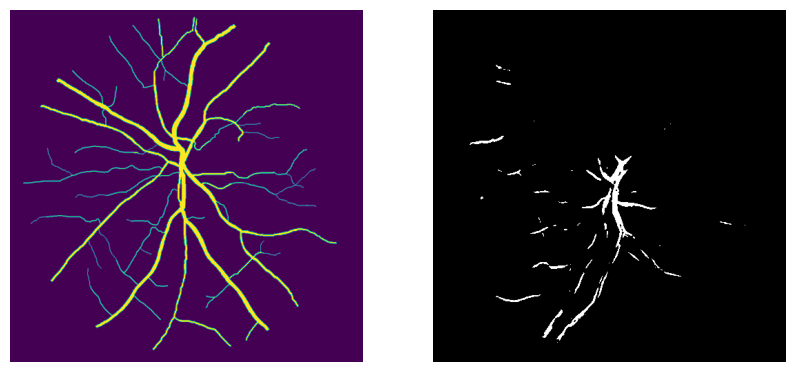

 21%|██▏       | 6/28 [00:03<00:11,  1.88it/s]

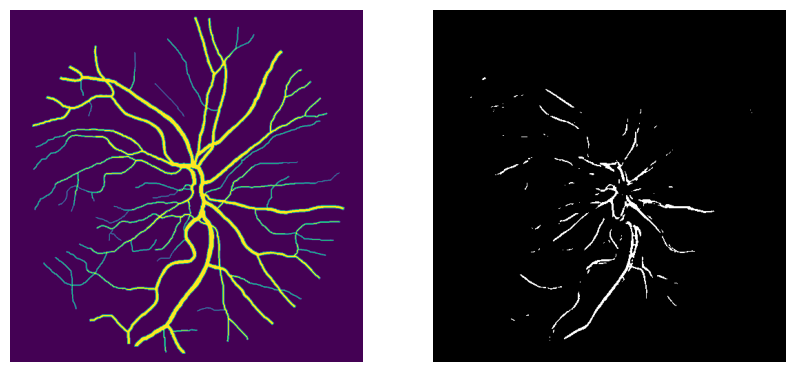

 25%|██▌       | 7/28 [00:03<00:10,  1.91it/s]

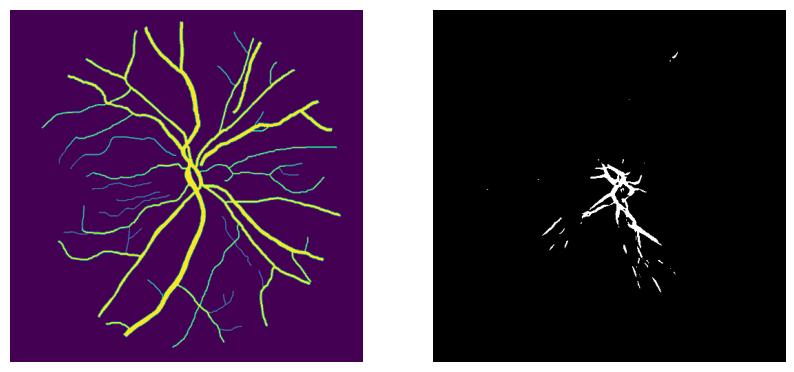

 29%|██▊       | 8/28 [00:04<00:10,  1.95it/s]

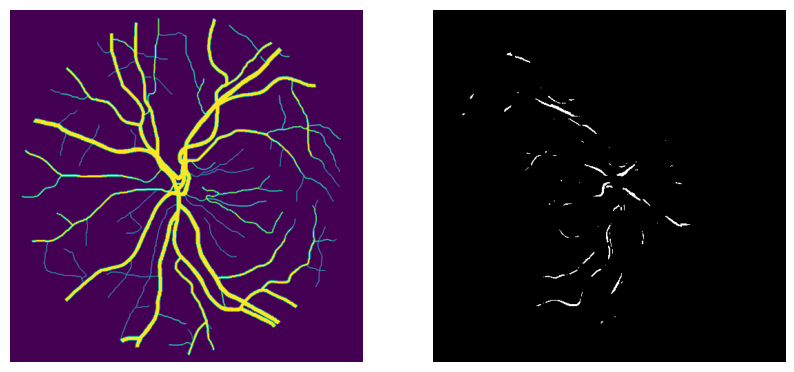

 32%|███▏      | 9/28 [00:04<00:09,  1.98it/s]

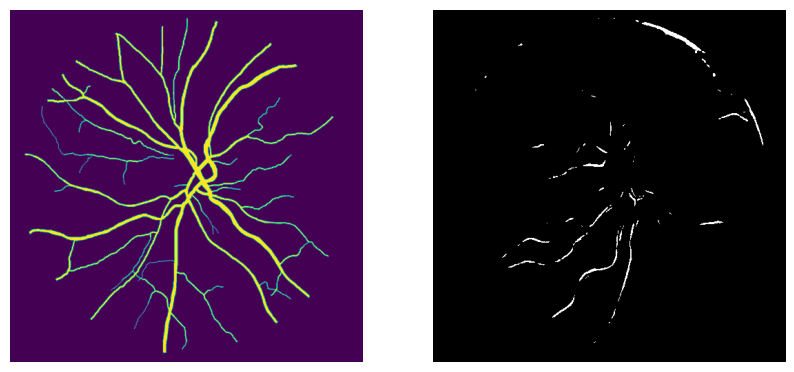

 36%|███▌      | 10/28 [00:05<00:09,  1.97it/s]

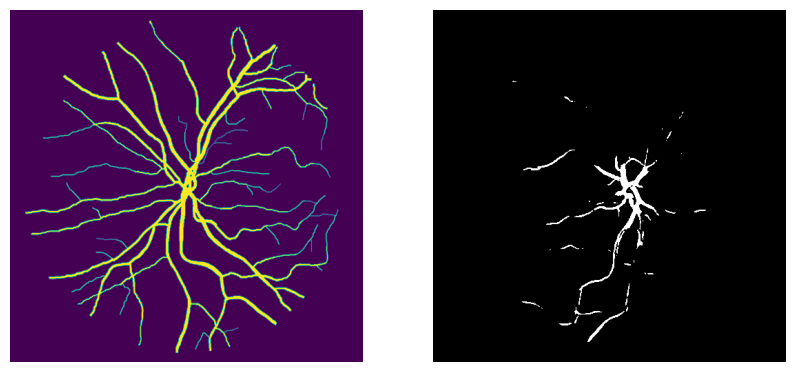

 39%|███▉      | 11/28 [00:05<00:08,  1.98it/s]

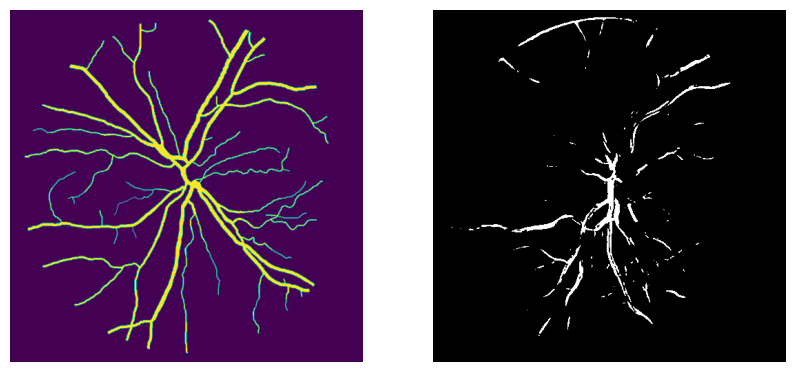

 43%|████▎     | 12/28 [00:06<00:08,  1.98it/s]

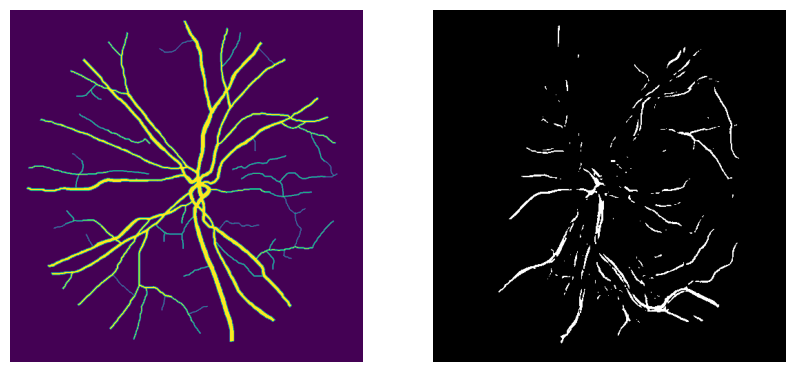

 46%|████▋     | 13/28 [00:06<00:07,  1.98it/s]

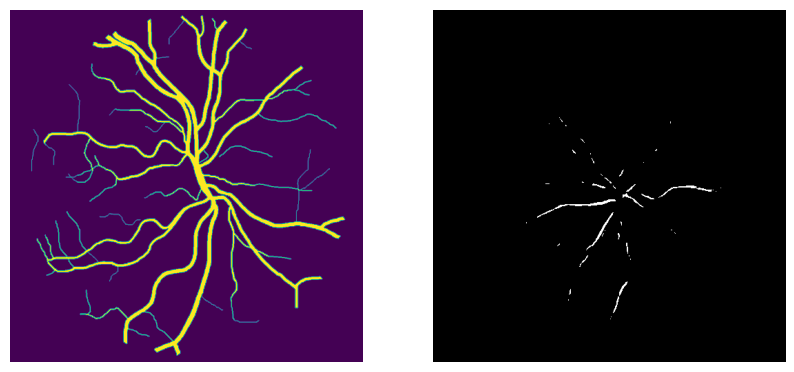

 50%|█████     | 14/28 [00:07<00:07,  1.98it/s]

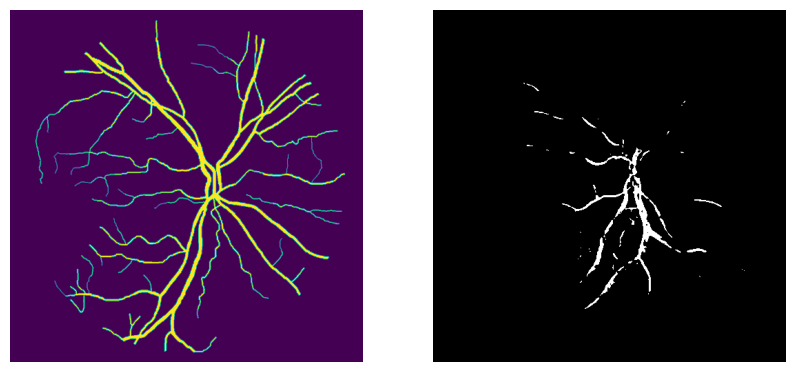

 54%|█████▎    | 15/28 [00:08<00:07,  1.84it/s]

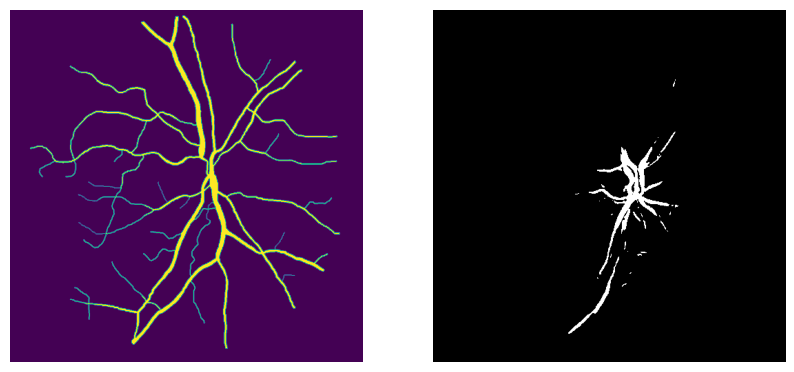

 57%|█████▋    | 16/28 [00:08<00:06,  1.88it/s]

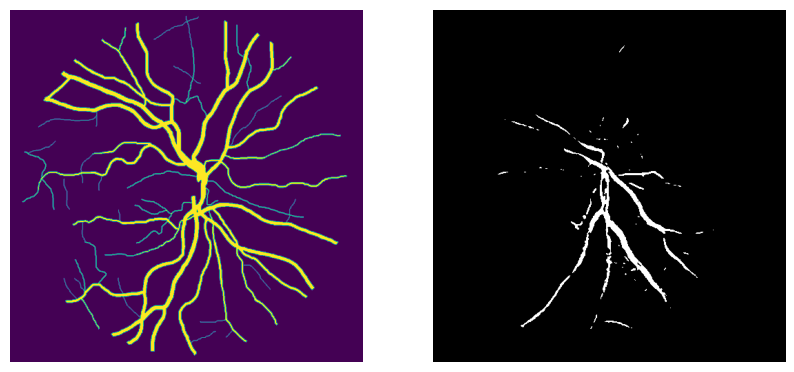

 61%|██████    | 17/28 [00:09<00:05,  1.92it/s]

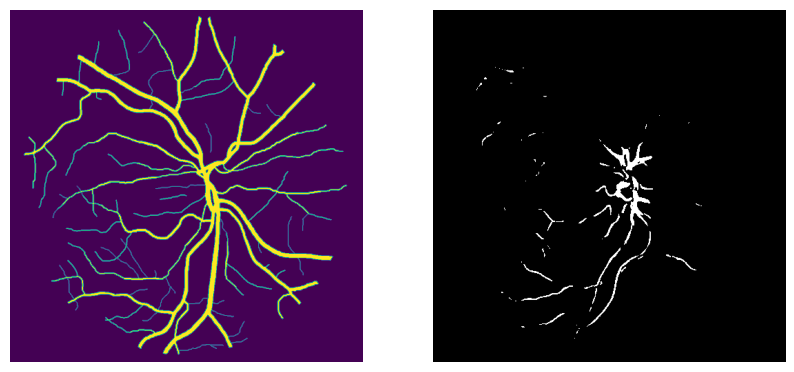

 64%|██████▍   | 18/28 [00:09<00:05,  1.95it/s]

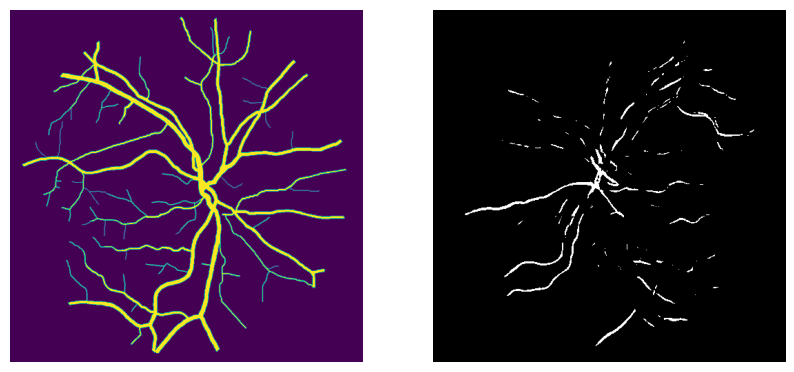

 68%|██████▊   | 19/28 [00:10<00:04,  1.97it/s]

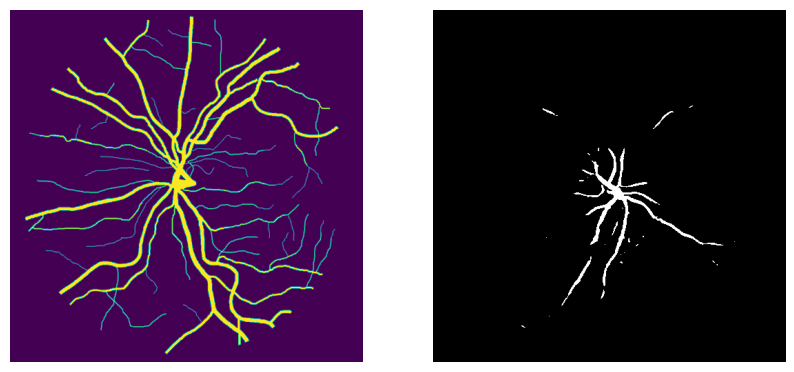

 71%|███████▏  | 20/28 [00:10<00:04,  1.99it/s]

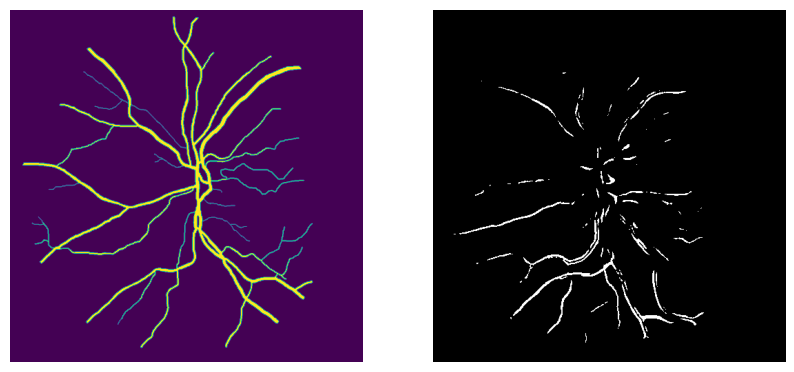

 75%|███████▌  | 21/28 [00:11<00:03,  2.01it/s]

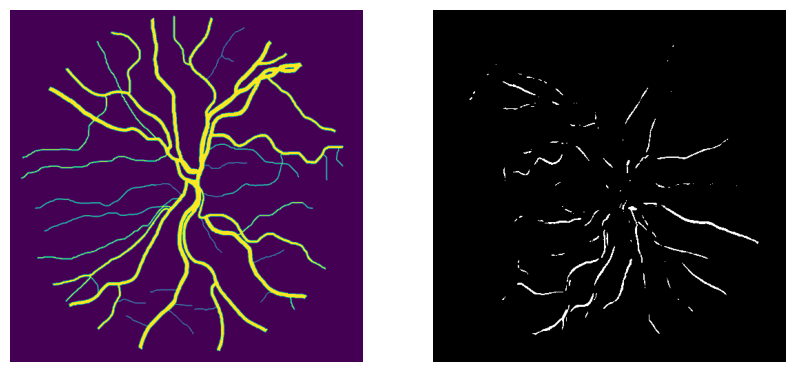

 79%|███████▊  | 22/28 [00:11<00:02,  2.01it/s]

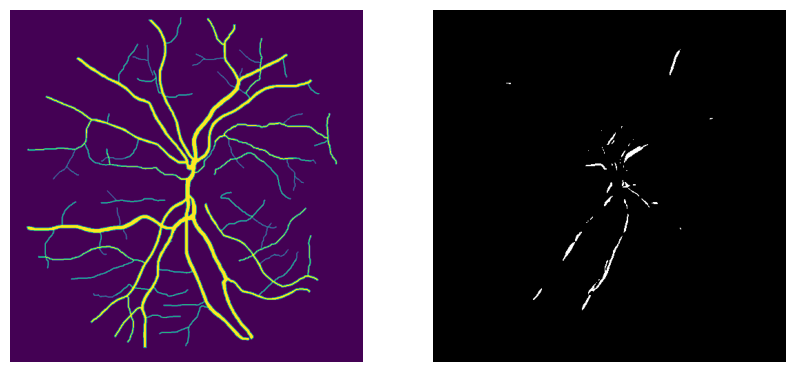

 82%|████████▏ | 23/28 [00:12<00:02,  2.02it/s]

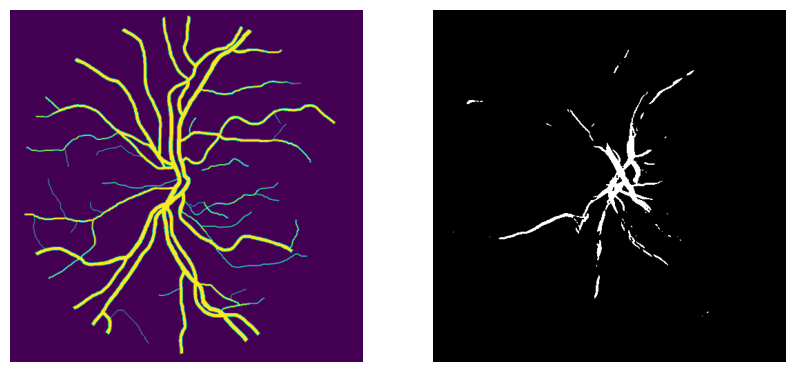

 86%|████████▌ | 24/28 [00:12<00:01,  2.01it/s]

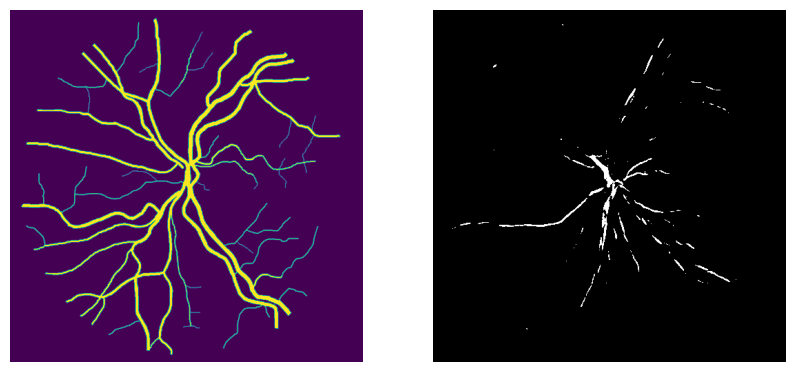

 89%|████████▉ | 25/28 [00:13<00:01,  1.82it/s]

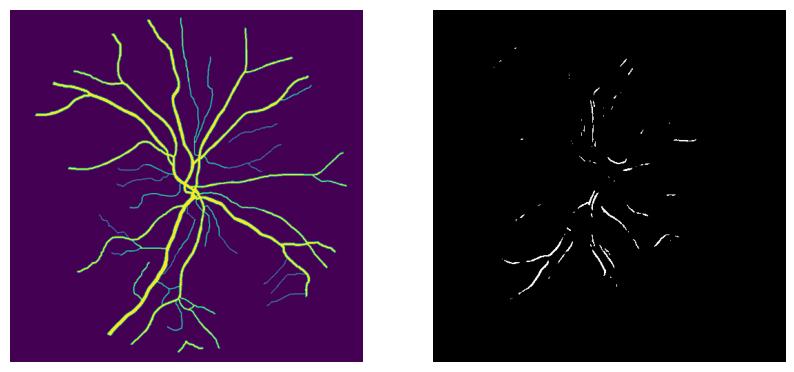

 93%|█████████▎| 26/28 [00:13<00:01,  1.88it/s]

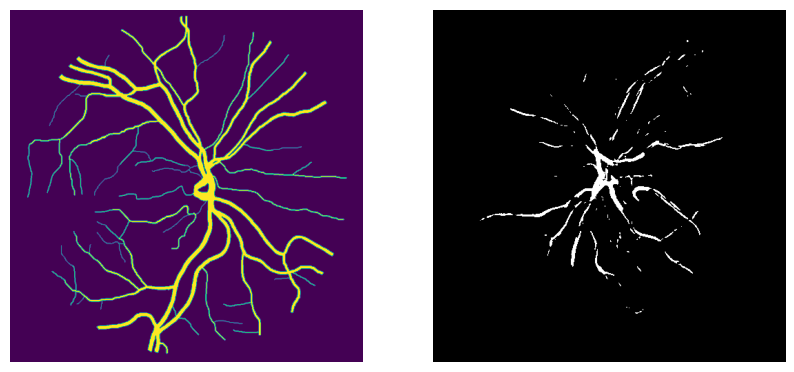

 96%|█████████▋| 27/28 [00:14<00:00,  1.73it/s]

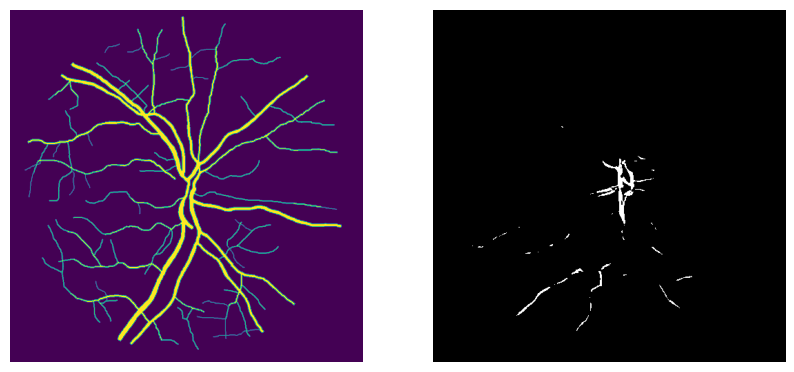

100%|██████████| 28/28 [00:15<00:00,  1.84it/s]


In [78]:

import os, time
from operator import add
import numpy as np
from glob import glob
import cv2
from tqdm import tqdm
import imageio
import torch
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
import matplotlib.pyplot as plt

def calculate_metrics(y_true, y_pred):
    """ Ground truth """
    y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)

    return [score_jaccard, score_f1, score_recall, score_precision, score_acc]

def mask_parse(mask):
    mask = np.expand_dims(mask, axis=-1)    ## (512, 512, 1)
    mask = np.concatenate([mask, mask, mask], axis=-1)  ## (512, 512, 3)
    return mask
ori_mask=0
pred_y=0
line=0
if __name__ == "__main__":
    """ Seeding """
    seeding(42)

    """ Folders """
    create_dir("/kaggle/working/")

    """ Load dataset """
    # test_x = sorted(glob("../new_data/test/image/*"))
    # test_y = sorted(glob("../new_data/test/mask/*"))

    dataset_test= CustomDataset("/kaggle/input/chase-db1/Images", "/kaggle/input/chase-db1/Masks")
    dataloader_test = DataLoader(dataset_test, batch_size=1, shuffle=True,num_workers=1,timeout=120)

    """ Hyperparameters """
    H = 512
    W = 512
    size = (W, H)
    checkpoint_path = "/kaggle/working/checkpoint.pth"

    """ Load the checkpoint """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = build_unet()
    model = model.to(device)
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.eval()

    metrics_score = [0.0, 0.0, 0.0, 0.0, 0.0]
    time_taken = []

    for i, batch in tqdm(enumerate(dataloader_test), total=len(dataloader_test)):
        x, y = batch["image"], batch["mask"]

        """ Extract the name """
        filename = dataset_test.image_filenames[i]
        name = os.path.splitext(filename)[0]
        # name = x.split("/")[-1].split(".")[0]

        """ Reading image """
        # image = cv2.imread(x, cv2.IMREAD_COLOR) ## (512, 512, 3)
        ## image = cv2.resize(image, size)
        # x = np.transpose(image, (2, 0, 1))      ## (3, 512, 512)
        # x = x/255.0
        # x = np.expand_dims(x, axis=0)           ## (1, 3, 512, 512)
        # x = x.astype(np.float32)
        # x = torch.from_numpy(x)
        x = x.to(device)

        """ Reading mask """
        # mask = cv2.imread(y, cv2.IMREAD_GRAYSCALE)  ## (512, 512)
        ## mask = cv2.resize(mask, size)
        # y = np.expand_dims(mask, axis=0)            ## (1, 512, 512)
        # y = y/255.0
        # y = np.expand_dims(y, axis=0)               ## (1, 1, 512, 512)
        # y = y.astype(np.float32)
        # y = torch.from_numpy(y)
        y = y.to(device)
        y_show=y.to('cpu')

        with torch.no_grad():
            """ Prediction and Calculating FPS """
            start_time = time.time()
            pred_y = model(x)
            pred_y = torch.sigmoid(pred_y)
            total_time = time.time() - start_time
            time_taken.append(total_time)


            score = calculate_metrics(y, pred_y)
            metrics_score = list(map(add, metrics_score, score))
            
            import matplotlib.pyplot as plt

            # assuming you have only one image and mask in the batch
#             pred_y_show=pred_y.to('cpu')
#             img = y_show[0].squeeze(0)
#             mask = pred_y_show[0].squeeze(0)


#             # plot the image and mask
#             fig, ax = plt.subplots(1, 2, figsize=(10, 5))
#             ax[0].imshow(img)
#             ax[0].axis('off')
#             ax[1].imshow(mask)
#             ax[1].axis('off')
#             plt.show()
            pred_y = pred_y[0].cpu().numpy()        ## (1, 512, 512)
            pred_y = np.squeeze(pred_y, axis=0)     ## (512, 512)
            pred_y = pred_y > 0.5
            pred_y = np.array(pred_y, dtype=np.uint8)
            
         # assuming you have only one image and mask in the batch
            
            img = y_show[0].squeeze(0)
            mask = pred_y


            # plot the image and mask
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            ax[0].imshow(img)
            ax[0].axis('off')
            ax[1].imshow(mask,cmap='gray')
            ax[1].axis('off')
            plt.show()
#         """ Saving masks """
#         ori_mask = mask_parse(y.cpu())
#         pred_y = mask_parse(pred_y)
#         line = np.ones((size[1], 10, 3)) * 128

#         cat_images = np.concatenate(
#             [ori_mask, line, pred_y * 255], axis=1
#         )
        

#         cv2.imwrite(f"/content/drive/MyDrive/DRIVE/{name}.png", cat_images)

#           mkdir 
#           pred_y = mask_parse(pred_y)
# #         

#           cat_images =  pred_y * 255 
        
#           cv2.imwrite(f"/content/drive/MyDrive/DRIVE/{name}.png", pred_y * 255)
# #         cv2.imwrite(f"/content/drive/MyDrive/DRIVE/{name}.png", cat_images)

    

In [79]:
jaccard = metrics_score[0]/len(dataloader_test)
f1 = metrics_score[1]/len(dataloader_test)
recall = metrics_score[2]/len(dataloader_test)
precision = metrics_score[3]/len(dataloader_test)
acc = metrics_score[4]/len(dataloader_test)
print(f"Jaccard: {jaccard:1.4f} - F1: {f1:1.4f} - Recall: {recall:1.4f} - Precision: {precision:1.4f} - Acc: {acc:1.4f}")

fps = 1/np.mean(time_taken)
print("FPS: ", fps)

Jaccard: 0.0353 - F1: 0.0668 - Recall: 0.0412 - Precision: 0.1980 - Acc: 0.9223
FPS:  117.1792023786955


In [80]:
len(dataloader_test)

28